In [1]:
#Importe de librerias 

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import corner
import seaborn as sns
from tqdm import tqdm
from torch.utils.data import TensorDataset, DataLoader, random_split

In [2]:
# Cargar el archivo con los datos y convertirlo en un DataFrame de Pandas 
dic = pickle.load(open('/global/cfs/cdirs/desc-wl/users/aplazas/trainingDataSetHSC_RC2.pkl', 'rb'))
data=pd.DataFrame(dic)

In [3]:
# Imprimir el número de estrellas con el que voy a entrenar la red 
starIDs = list(dic.keys())
print("Number of stars:", len(starIDs))

Number of stars: 2787956


In [4]:
# Imprimir algunos datos 
data

,36492_83_z_15673372897705999,36492_83_z_15673372897706010,36492_83_z_15673372897706051,36492_83_z_15673372897706060,36492_83_z_15673372897706071,36492_83_z_15673372897706074,36492_83_z_15673372897706089,36492_83_z_15673372897706117,36492_83_z_15673372897706155,36492_83_z_15673372897706179,...,34464_16_g_14802209648673383,34464_16_g_14802209648673422,34464_16_g_14802209648673540,34464_16_g_14802209648673550,34464_16_g_14802209648673580,34464_16_g_14802209648673581,34464_16_g_14802209648673583,34464_16_g_14802209648673603,34464_16_g_14802209648673605,34464_16_g_14802209648673607
star,"[[-0.0012822378, 0.00067583215, -0.0008104421,...","[[0.0004938867, -0.0001008491, -0.00012265168,...","[[6.667204e-05, -8.601485e-05, -5.7728725e-05,...","[[-0.00043453195, 0.0017447713, -0.0010638004,...","[[6.642206e-05, 0.00010550796, -5.120103e-05, ...","[[2.0390176e-05, 0.00026200217, 0.00012830437,...","[[0.00039876578, 0.0005250384, -0.0010655265, ...","[[0.0014305757, -0.0003610301, 0.0007611479, -...","[[5.514675e-05, -2.0906898e-05, 6.6478875e-05,...","[[-0.0004542047, 0.0007291905, -0.0009192974, ...",...,"[[0.00012841454, -0.00023131266, -9.82557e-06,...","[[3.0922263e-05, 0.00015426998, 0.0001653774, ...","[[2.9871047e-05, 8.292985e-05, 0.00026179213, ...","[[0.00015403381, -0.00033956577, 9.017633e-05,...","[[1.4672469e-05, 9.143532e-05, 0.00020243658, ...","[[-0.0003996648, 0.0018000732, 0.0003933758, -...","[[0.00020393233, 0.00044855077, -9.2850685e-05...","[[-0.00050741533, 0.000248747, 0.0002583448, -...","[[-0.00031539955, 0.0004362889, -0.00032765258...","[[0.00018709376, -0.00050114526, -0.0001282764..."
weight,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
starPiff,"[[-3.9978913e-06, 0.000592853, -0.00022917663,...","[[0.00020523621, 2.2644823e-05, -0.0004133971,...","[[-8.761386e-06, -0.000102192425, -9.819647e-0...","[[0.0001216039, 0.00012945474, -0.00041106265,...","[[5.7720754e-06, 0.00045413253, -0.00029522806...","[[0.000101048136, -4.4232744e-05, 8.475549e-06...","[[0.00016241864, 0.00046553405, -0.00017584076...","[[0.00039299516, 0.00027328526, -0.00022749716...","[[3.7119382e-05, -0.0001366241, 8.202435e-05, ...","[[-2.160605e-06, 0.0005074914, -0.00020224885,...",...,"[[-4.639846e-05, 0.000109978624, 7.224298e-05,...","[[5.3442975e-05, 0.00011443844, 3.7527916e-05,...","[[-0.00015364762, 0.00018469652, 7.723205e-05,...","[[5.1292867e-05, 0.00029478956, -6.912713e-05,...","[[-9.4005976e-05, 0.0002421441, 0.00015680277,...","[[-0.00019098556, 0.00029724385, 0.0003209697,...","[[6.510005e-05, 0.00013282608, -3.9216964e-05,...","[[-8.222882e-05, 0.00019887614, 0.00018300477,...","[[-0.00011194424, 0.00030618435, 7.456774e-05,...","[[4.3068216e-05, 0.00012113015, -4.698689e-05,..."
sigmaStar,1.665329,1.636456,1.617733,1.596746,1.633847,1.622522,1.628764,1.618087,1.612827,1.654413,...,2.996628,3.005419,2.969148,2.956927,2.958891,2.985635,2.904958,2.954404,2.952791,2.906172
e1Star,-0.076315,-0.089407,-0.115842,-0.070694,-0.094147,-0.117076,-0.09433,-0.094369,-0.114732,-0.09239,...,0.004503,0.000426,0.003308,0.009613,0.005385,-0.04516,0.005064,0.007486,0.021524,-0.007409
e2Star,-0.169981,-0.114384,-0.121832,-0.123585,-0.111681,-0.123785,-0.113708,-0.121893,-0.125171,-0.113532,...,-0.050769,-0.054597,-0.052801,-0.064038,-0.057917,-0.016931,-0.059104,-0.051037,-0.054716,-0.094704
sigmaPiff,1.640291,1.645642,1.617427,1.633973,1.641021,1.616712,1.627439,1.630195,1.615276,1.63516,...,2.988258,3.007378,2.94249,2.955605,2.952088,2.93526,2.966084,2.962055,2.93596,2.967499
e1Piff,-0.088148,-0.080557,-0.115699,-0.095558,-0.086314,-0.116003,-0.103212,-0.099298,-0.115099,-0.092482,...,0.002552,0.00257,0.003514,0.00722,0.008411,0.005322,0.008381,0.008898,0.007572,0.008658
e2Piff,-0.11939,-0.118062,-0.125945,-0.120591,-0.118709,-0.126073,-0.122333,-0.121257,-0.125921,-0.119391,...,-0.0615,-0.057067,-0.061799,-0.056166,-0.054315,-0.059614,-0.051207,-0.050517,-0.056577,-0.049357


In [5]:
# Nombre de las estrellas con las que estoy trabajando
print(data.columns[0])

36492_83_z_15673372897705999


In [6]:
# Quiero conocer los píxeles de la imagen primera estrella
sample_array = data["36492_83_z_15673372897705999"].iloc[0]
#print(sample_array)
print(sample_array.shape)

(25, 25)


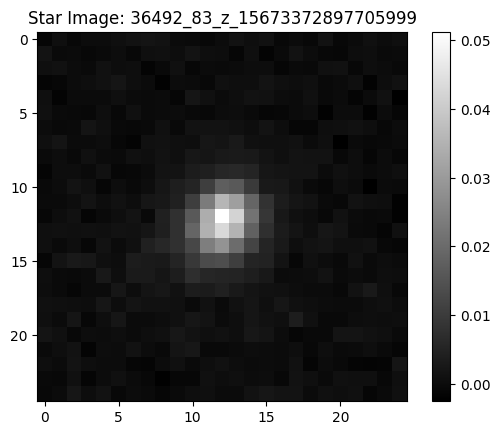

In [7]:
# Hago lo mismo pero esta vez para graficar la estrella
# Estoy trabajando con imágenes de 25x25 píxeles

sample_array = data["36492_83_z_15673372897705999"].iloc[0]
sample_array = np.array(sample_array)
image = sample_array.reshape((25, 25)) 

plt.imshow(image, cmap='gray')
plt.colorbar()
plt.title("Star Image: 36492_83_z_15673372897705999")
plt.show()


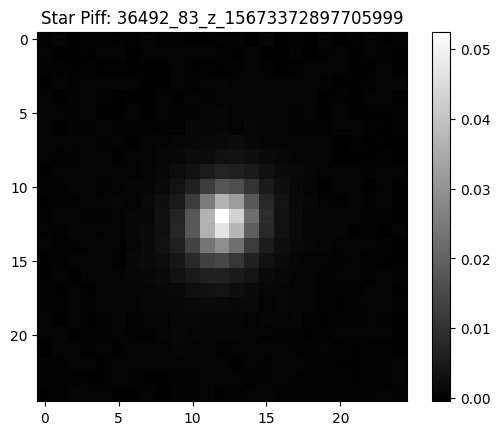

In [8]:
#Para graficar otra estrella 

sample_array = data["36492_83_z_15673372897705999"].iloc[2]
sample_array = np.array(sample_array)
image = sample_array.reshape((25, 25)) 

plt.imshow(image, cmap='gray')
plt.colorbar()
plt.title("Star Piff: 36492_83_z_15673372897705999")
plt.show()

### Description of data

| **Column**   | **Description**                                                                 |
|--------------|----------------------------------------------------------------------------------|
| `star`       | 2D image of the observed star (used as ground truth).                           |
| `starPiff`   | 2D image of the modeled PSF for the star from Piff.                             |
| `sigmaStar`  | Size (standard deviation) of the observed star's light profile.                 |
| `e1Star`     | First component of the ellipticity of the observed star.                        |
| `e2Star`     | Second component of the ellipticity of the observed star.                       |
| `sigmaPiff`  | Size (standard deviation) of the modeled PSF.                                   |
| `e1Piff`     | First component of the ellipticity of the modeled PSF.                          |
| `e2Piff`     | Second component of the ellipticity of the modeled PSF.                         |
| `xCCD`       | X-coordinate of the star on the CCD detector.                                   |
| `yCCD`       | Y-coordinate of the star on the CCD detector.                                   |
| `xFoV`       | X-coordinate in the field of view (FoV) of the telescope.                       |
| `yFoV`       | Y-coordinate in the field of view (FoV) of the telescope.                       |
| `weight`     | Statistical weight assigned to the star in the modeling process.                |
| `sumStar`    | Total flux (brightness) of the observed star.                                   |
| `detector`   | ID of the CCD detector that captured the image.                                 |
| `visit`      | Identifier of the observation (exposure or visit number).                       |
| `band`       | Filter used during observation (e.g., g, r, i, z, y).                           |


Para el desarrollo del proyecto voy a usar star para entrenar el modelo, starPiff para comparar si el modelo entrenado da mejores resultados que el mejor modelo actual para la PSF (Piff), visit para graficar el plano focal (xFoV, yFov) en función de cada visita. 

In [7]:
# Para entender como están distribuidas las visitas y como estan etiquetadas 

visit = np.array(data.iloc[15])

print("Primera visita", np.unique(visit)[0])
print("Última Visita", np.unique(visit)[-1])
print("Número de visitas", len(np.unique(visit)))

Primera visita 318
Última Visita 38950
Número de visitas 404


In [8]:
# Para conocer cómo está distribuido el plano focal por visita

xFoV=np.array(data.iloc[11])
yFoV=np.array(data.iloc[12])

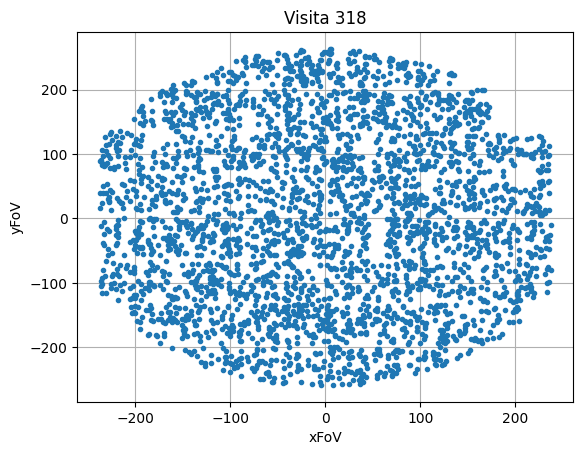

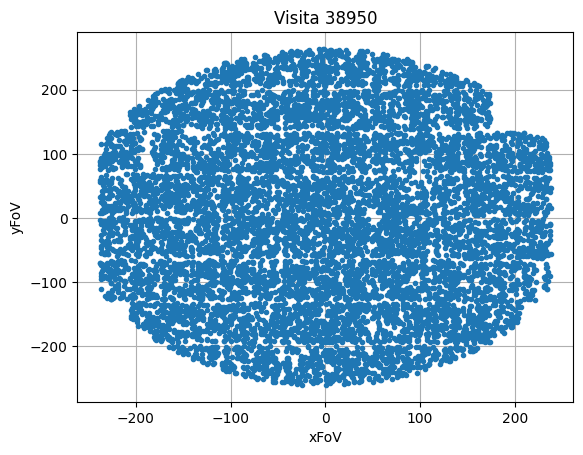

In [12]:
# Muestreo visitas --> Gráfico de la primera y la última visita  

visitas = [318, 38950]

for i in visitas:
    mask = (visit==i)
    x=xFoV[mask]
    y=yFoV[mask]

    plt.figure()  # nueva figura
    plt.plot(x, y, '.')
    plt.title(f'Visita {i}')
    plt.xlabel('xFoV')
    plt.ylabel('yFoV')
    plt.grid(True)
    plt.show()

Para comenzar a entrenar el modelo 

In [9]:
all_images= np.array(data.iloc[0])
# Convierte a un array NumPy 3D: (N, 25, 25)
all_images = np.stack(all_images)  
# Agrega un canal para PyTorch: (N, 1, 25, 25)
all_images = np.expand_dims(all_images, axis=1)

In [10]:
# Hago lo mismo con Piff
# Lo que quiero hacer darle el formato a las imágenes para que sean tensores compatibles con Pytorch 

piff = np.array(data.iloc[2])
piff=np.stack(piff)
piff=np.expand_dims(piff,axis=1)


In [11]:
# Para calcular el error cuadrático medio entre el modelo piff yy las imágenes
tensor_images = torch.tensor(all_images, dtype=torch.float32)
tensor_piff = torch.tensor(piff, dtype=torch.float32)
MSE = nn.MSELoss()(tensor_images, tensor_piff).item()

MSE

3.6808537515753414e-06

In [32]:
dataset = TensorDataset(tensor_images, tensor_images)
full_loader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=False)
len(dataset)

2787956

In [23]:
train_size = int(0.8 * len(dataset))  # 80% para entrenamiento
val_size = len(dataset) - train_size  # 20% para validación
generator = torch.Generator().manual_seed(1)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

# Crea DataLoaders
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, drop_last=True) #shuffle=True mezcla aleatoriamente los datos 
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False, drop_last=True)


In [14]:
class Autoencoder(nn.Module):
    def __init__(self, latent_dim: int):
        super(Autoencoder, self).__init__()
         
        
        # Encoder (capas progresivamente más pequeñas)
        self.encoder = nn.Sequential(
            nn.Flatten(),
            nn.Linear(625,312),
            nn.ReLU(),
            nn.Linear(312, 156), 
            nn.ReLU(),
            nn.Linear(156, 78),
            nn.ReLU(),
            nn.Linear(78, latent_dim)

            
        )
        
        # Decoder (capas simétricas al encoder)
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 78),
            nn.ReLU(),
            nn.Linear(78, 156),
            nn.ReLU(),
            nn.Linear(156, 312),
            nn.ReLU(),
            nn.Linear(312, 625),
            nn.Softmax(dim=1),
            nn.Unflatten(1, (1, 25, 25)),  # Volver a la forma original
            

        )

    def forward(self, x: torch.Tensor): # x es el tensor de entrada  
        z = self.encoder(x) # El resultado de z es el espacio latente (lo que aprendió la red)
        out = self.decoder(z) #out es la versión reconstruida de la imagen 
        return out

In [15]:
# Dimensión del espacio latente
latent_dim = 16

# Dispositivo
device = torch.device("cpu")

# Modelo
autoencoder = Autoencoder(latent_dim=latent_dim).to(device)


In [16]:
autoencoder = Autoencoder(latent_dim)  # tu clase
autoencoder.load_state_dict(torch.load("autoencoder_parameterslr.pth"))
autoencoder.eval()  # importante para que funcione en modo inferencia

Autoencoder(
  (encoder): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=625, out_features=312, bias=True)
    (2): ReLU()
    (3): Linear(in_features=312, out_features=156, bias=True)
    (4): ReLU()
    (5): Linear(in_features=156, out_features=78, bias=True)
    (6): ReLU()
    (7): Linear(in_features=78, out_features=16, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=16, out_features=78, bias=True)
    (1): ReLU()
    (2): Linear(in_features=78, out_features=156, bias=True)
    (3): ReLU()
    (4): Linear(in_features=156, out_features=312, bias=True)
    (5): ReLU()
    (6): Linear(in_features=312, out_features=625, bias=True)
    (7): Softmax(dim=1)
    (8): Unflatten(dim=1, unflattened_size=(1, 25, 25))
  )
)

In [17]:
autoencoder.eval()

with torch.no_grad():
    # Enviar todas las imágenes al mismo dispositivo que el modelo
    x_all = tensor_images.to(device)  # (N, 1, 25, 25)
    
    # Obtener los vectores en el espacio latente
    z_all = autoencoder.encoder(x_all)  # (N, latent_dim)

# z_all es un tensor donde cada fila es el vector latente de una imagen
print("Tamaño del espacio latente:", z_all.shape)


# Convertir a NumPy
z_all_np = z_all.cpu().numpy()  # (N, latent_dim)

#z_all_np

Tamaño del espacio latente: torch.Size([2787956, 16])


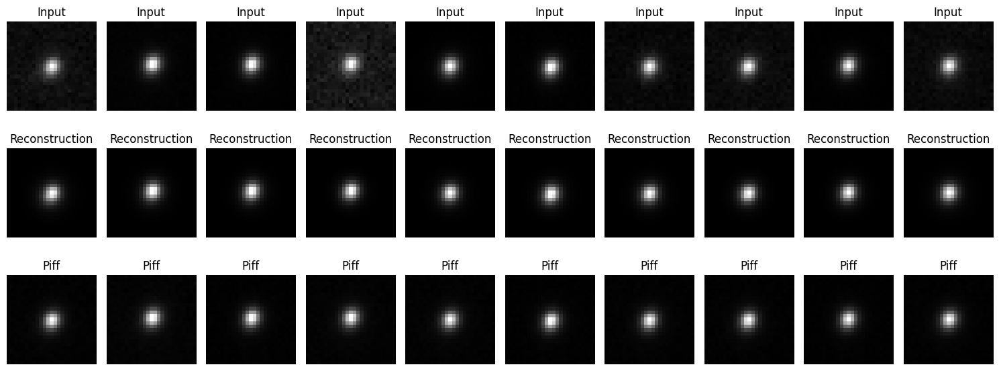

In [39]:
# Poner el modelo en modo evaluación
autoencoder.eval()

# Tomar un batch del dataset completo
x_batch, _ = next(iter(full_loader))
x_batch = x_batch.to(device)

piff_loader  = DataLoader(piff, batch_size=128, shuffle=False)

x_piff_batch = next(iter(piff_loader))

with torch.no_grad():
    x_hat = autoencoder(x_batch)

# Visualizar las primeras N imágenes, sus reconstrucciones y el error
n = 10
plt.figure(figsize=(15, 6))

for i in range(n):
    # Imagen original
    ax = plt.subplot(3, n, i + 1)
    plt.imshow(x_batch[i, 0].cpu(), cmap="gray")
    ax.set_title("Input")
    plt.axis("off")

    # Imagen reconstruida
    ax = plt.subplot(3, n, i + 1 + n)
    plt.imshow(x_hat[i, 0].cpu(), cmap="gray")
    ax.set_title("Reconstruction")
    plt.axis("off")

    ax = plt.subplot(3, n, i + 1 + 2 * n)
    plt.imshow(x_piff_batch[i, 0], cmap="gray")
    ax.set_title("Piff")
    plt.axis("off")

plt.tight_layout()
plt.savefig('reconstruccion.png')
plt.show()



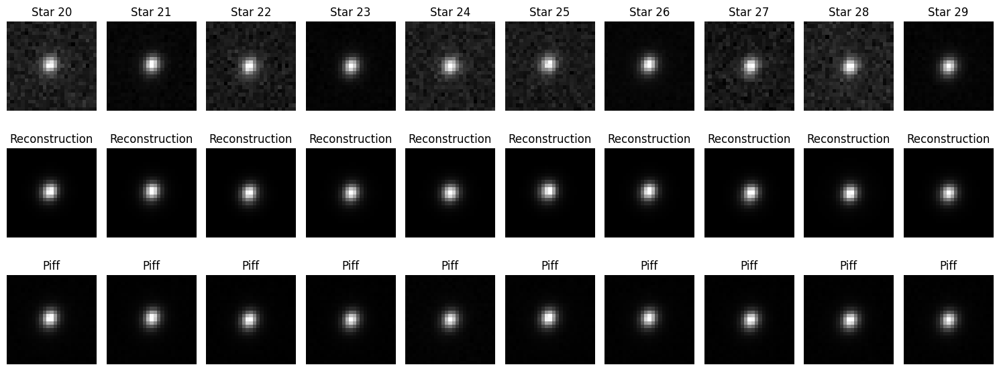

In [49]:
# Poner el modelo en modo evaluación
autoencoder.eval()

# Tomar un batch del dataset completo
x_batch, _ = next(iter(full_loader))
x_batch = x_batch.to(device)

piff_loader  = DataLoader(piff, batch_size=128, shuffle=False)

x_piff_batch = next(iter(piff_loader))

with torch.no_grad():
    x_hat = autoencoder(x_batch)

    
start = 20
end = 30
n = end - start  # número de imágenes a mostrar

plt.figure(figsize=(15, 6))

for i in range(n):
    idx = start + i  # índice global de la imagen

    # Imagen original
    ax = plt.subplot(3, n, i + 1)
    plt.imshow(x_batch[idx, 0].cpu(), cmap="gray")
    ax.set_title(f"Star {idx}")
    plt.axis("off")

    # Imagen reconstruida
    ax = plt.subplot(3, n, i + 1 + n)
    plt.imshow(x_hat[idx, 0].cpu(), cmap="gray")
    ax.set_title("Reconstruction")
    plt.axis("off")

    # Imagen PIFF
    ax = plt.subplot(3, n, i + 1 + 2 * n)
    plt.imshow(x_piff_batch[idx, 0], cmap="gray")
    ax.set_title("Piff")
    plt.axis("off")

plt.tight_layout()
plt.savefig('reconstruccion_20_30.png')
plt.show()

In [18]:
visit = np.array(visit)

mask = (visit == 318)

# Aplicar el filtro a todas tus variables
x_filtered = xFoV[mask]
y_filtered = yFoV[mask]
z_filtered = z_all_np[mask]  # (n_samples_filtrados, latent_dim)

z_filtered

array([[ 0.00698169,  0.02585979,  0.3000305 , ...,  0.49353403,
         0.08918624, -0.11025108],
       [-0.00796315,  0.04893629,  0.2690851 , ...,  0.5083256 ,
         0.1414669 , -0.12858267],
       [ 0.01556608, -0.001021  ,  0.34665307, ...,  0.48294663,
         0.04380812, -0.08618103],
       ...,
       [ 0.01149354,  0.0044208 ,  0.33715552, ...,  0.4817577 ,
         0.05912451, -0.09598257],
       [ 0.04075734,  0.01061897,  0.30455288, ...,  0.5019561 ,
         0.06537144, -0.10163034],
       [-0.03862982,  0.04704848,  0.31292734, ...,  0.49906218,
         0.19979869, -0.11744489]], shape=(3165, 16), dtype=float32)

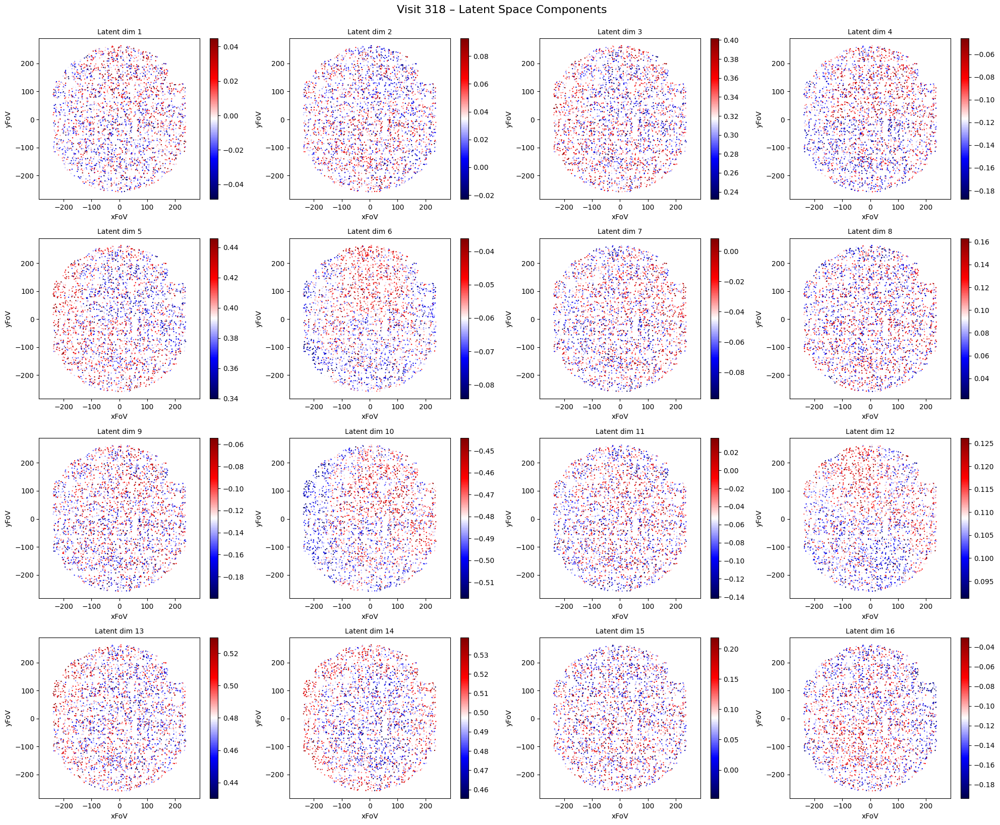

In [19]:
visit = np.array(visit)
mask = (visit == 318)

# Aplicar el filtro a todas tus variables
x_filtered = xFoV[mask]
y_filtered = yFoV[mask]
z_filtered = z_all_np[mask]  # (n_samples_filtrados, latent_dim)

n_latent = z_filtered.shape[1]
n_rows, n_cols = 4, 4

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 16))
axes = axes.flatten() 

for i in range(n_latent):
    z_comp = z_filtered[:, i]

    mean = np.mean(z_comp)
    std = np.std(z_comp)
    vmin = mean - 2 * std
    vmax = mean + 2 * std

    ax = axes[i]
    scatter = ax.scatter(x_filtered, y_filtered, c=z_comp, cmap='seismic', vmin=vmin, vmax=vmax, s=0.5)
    ax.set_title(f"Latent dim {i+1}", fontsize=10)
    ax.set_xlabel("xFoV")
    ax.set_ylabel("yFoV")
    ax.axis("equal")
    fig.colorbar(scatter, ax=ax)


plt.tight_layout()
plt.suptitle("Visit 318 – Latent Space Components", fontsize=16, y=1.02)
plt.savefig('visita318.png')
plt.show()


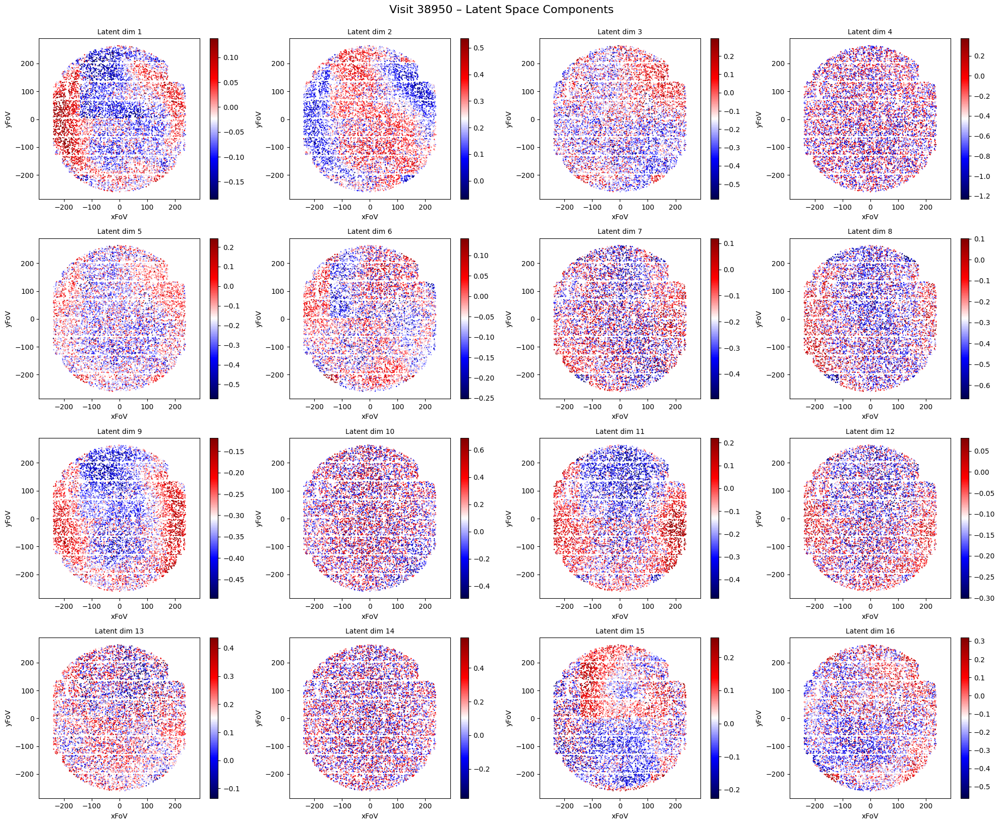

In [20]:
visit = np.array(visit)
mask = (visit == 38950)

# Aplicar el filtro a todas tus variables
x_filtered = xFoV[mask]
y_filtered = yFoV[mask]
z_filtered = z_all_np[mask]  # (n_samples_filtrados, latent_dim)

n_latent = z_filtered.shape[1]
n_rows, n_cols = 4, 4

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 16))
axes = axes.flatten() 

for i in range(n_latent):
    z_comp = z_filtered[:, i]

    mean = np.mean(z_comp)
    std = np.std(z_comp)
    vmin = mean - 2 * std
    vmax = mean + 2 * std

    ax = axes[i]
    scatter = ax.scatter(x_filtered, y_filtered, c=z_comp, cmap='seismic', vmin=vmin, vmax=vmax, s=0.5)
    ax.set_title(f"Latent dim {i+1}", fontsize=10)
    ax.set_xlabel("xFoV")
    ax.set_ylabel("yFoV")
    ax.axis("equal")
    fig.colorbar(scatter, ax=ax)


plt.tight_layout()
plt.suptitle("Visit 38950 – Latent Space Components", fontsize=16, y=1.02)
plt.savefig('visita38950.png')
plt.show()

In [21]:
# Cornerplot para observar las correlaciones entre las componentes del espacio latente para la visita 318 

'''mask = (visit == 318)

# Aplicar el filtro a todas tus variables
x_filtered = xFoV[mask]
y_filtered = yFoV[mask]
z_filtered = z_all_np[mask]  # (n_samples_filtrados, latent_dim)

corner_fig = corner.corner(z_filtered, 
                           labels=[f"z{i}" for i in range(z_filtered.shape[1])],
                           max_n_ticks=3)

plt.show()''' 

'mask = (visit == 318)\n\n# Aplicar el filtro a todas tus variables\nx_filtered = xFoV[mask]\ny_filtered = yFoV[mask]\nz_filtered = z_all_np[mask]  # (n_samples_filtrados, latent_dim)\n\ncorner_fig = corner.corner(z_filtered, \n                           labels=[f"z{i}" for i in range(z_filtered.shape[1])],\n                           max_n_ticks=3)\n\nplt.show()'

In [35]:
# 1. Centro del espacio latente
center = np.mean(z_all_np, axis=0) # El resultado es una lista con 16 datos, estos datos representan la media de todos los primeros vectores latentes, luego los segundos, etc.

# 2. Distancias al centro

# Lo que se hace es restar de cada una de las 2 millones de estrellas las 16 componentes del espacio latente del centro 
distances = np.linalg.norm(z_all_np - center, axis=1) # El resultado es una lista con la distancia al centro de las dos millones de estrellas

# Calcula media y desviación estándar
mean_dist = np.mean(distances)
std_dist = np.std(distances)

# Considerar como outliers los que estén a más de 3 sigmas
mask = distances < (mean_dist + 1.5 * std_dist)

z_clean = z_all_np[mask]
xFoV_clean = xFoV[mask]
yFoV_clean = yFoV[mask]

print(len(xFoV_clean), len(xFoV))

print("Para 1.5 desviaciones estándar estoy descartando un", 100-(len(xFoV_clean)*100/len(xFoV)), "% de los datos")

2643328 2787956
Para 1.5 desviaciones estándar estoy descartando un 5.1875998043010725 % de los datos


In [36]:
# 1. Centro del espacio latente
center = np.mean(z_all_np, axis=0) # El resultado es una lista con 16 datos, estos datos representan la media de todos los primeros vectores latentes, luego los segundos, etc.

# 2. Distancias al centro

# Lo que se hace es restar de cada una de las 2 millones de estrellas las 16 componentes del espacio latente del centro 
distances = np.linalg.norm(z_all_np - center, axis=1) # El resultado es una lista con la distancia al centro de las dos millones de estrellas

# Calcula media y desviación estándar
mean_dist = np.mean(distances)
std_dist = np.std(distances)

# Considerar como outliers los que estén a más de 3 sigmas
mask = distances < (mean_dist + 3 * std_dist)

z_clean = z_all_np[mask]
xFoV_clean = xFoV[mask]
yFoV_clean = yFoV[mask]

print(len(xFoV_clean), len(xFoV))

print("Para 3 desviaciones estándar estoy descartando un", 100-(len(xFoV_clean)*100/len(xFoV)), " % de los datos")

2766783 2787956
Para 3 desviaciones estándar estoy descartando un 0.7594452710157498  % de los datos


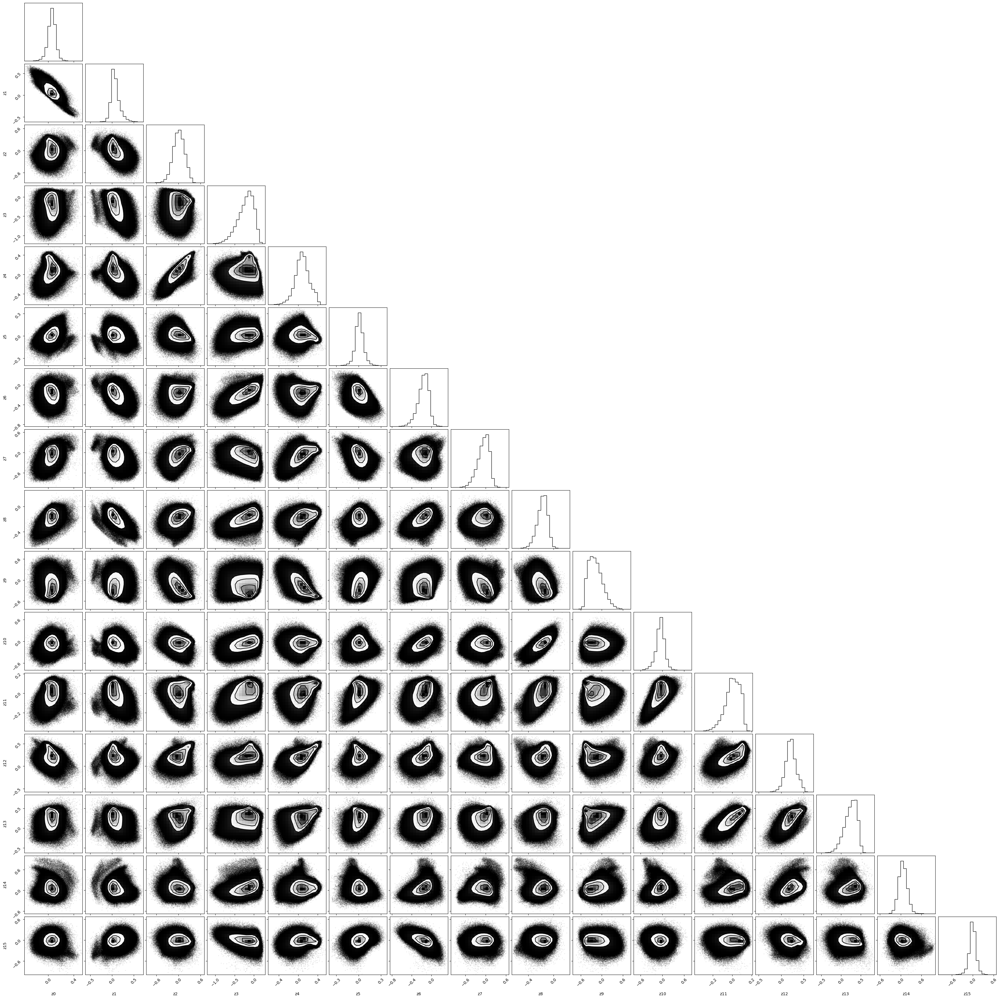

In [26]:
# 1. Centro del espacio latente
center = np.mean(z_all_np, axis=0)

# 2. Distancias al centro
distances = np.linalg.norm(z_all_np - center, axis=1)

# Calcula media y desviación estándar
mean_dist = np.mean(distances)
std_dist = np.std(distances)

# Considerar como outliers los que estén a más de 3 sigmas
mask = distances < (mean_dist + 3 * std_dist)

z_clean = z_all_np[mask]
xFoV_clean = xFoV[mask]
yFoV_clean = yFoV[mask]


visit = np.array(visit)

# Aplicar el filtro a todas tus variables
x_filtered = xFoV_clean
y_filtered = yFoV_clean
z_filtered = z_clean  # (n_samples_filtrados, latent_dim)
    
corner_fig = corner.corner(z_filtered, 
                               labels=[f"z{i}" for i in range(z_filtered.shape[1])],
                               max_n_ticks=3)

plt.savefig('testparameterslr.pdf')
plt.show()